In [ ]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

In [ ]:
from fastai import *
from fastai.vision import *

In [ ]:
path = Path("/content/drive/My Drive/train")

In [ ]:
fnames = get_image_files(path)
fnames[:5]

[PosixPath('/content/drive/My Drive/train/meg_99.jpg'),
 PosixPath('/content/drive/My Drive/train/meg_73.jpg'),
 PosixPath('/content/drive/My Drive/train/meg_52.jpg'),
 PosixPath('/content/drive/My Drive/train/meg_98.jpg'),
 PosixPath('/content/drive/My Drive/train/meg_95.jpg')]

In [ ]:
np.random.seed(2)
pat = r'/([^/]+)_\d+.jpg$'

In [ ]:
tfms = get_transforms()
data_1 = ImageDataBunch.from_name_re(path, fnames, pat, valid_pct=0.2, ds_tfms=tfms, size=224)

In [ ]:
data_1.normalize(imagenet_stats)

ImageDataBunch;

Train: LabelList (89 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
meg,meg,meg,meg,meg
Path: /content/drive/My Drive/train;

Valid: LabelList (22 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
xael,xael,xael,meg,xael
Path: /content/drive/My Drive/train;

Test: None

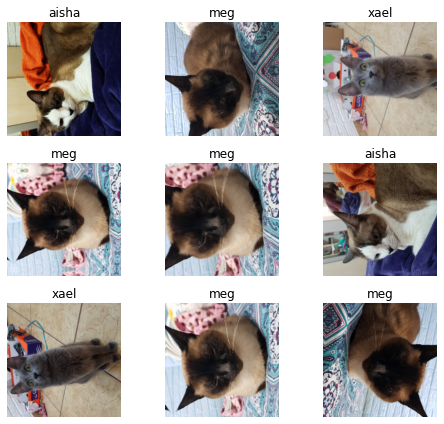

In [ ]:
data_1.show_batch(rows=3, figsize=(7,6))

In [ ]:
print(data_1.classes)
len(data_1.classes), data_1.c

['aisha', 'meg', 'xael']


(3, 3)

In [ ]:
len(data_1.train_ds), len(data_1.valid_ds)

(89, 22)

In [ ]:
learn = cnn_learner(data_1, models.resnet34, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


In [ ]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.093342,1.336844,0.318182,00:48
1,1.708774,0.016783,0.000000,00:22
2,1.149804,0.003053,0.000000,00:22
3,0.854343,0.001583,0.000000,00:22


In [ ]:
learn.save('cats_1')

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

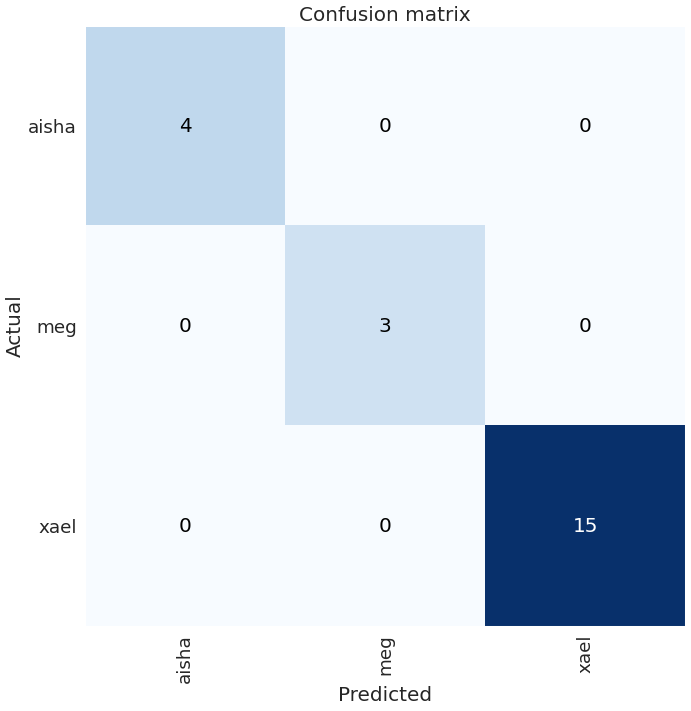

In [ ]:
import seaborn as sns
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
sns.set(font_scale=2);

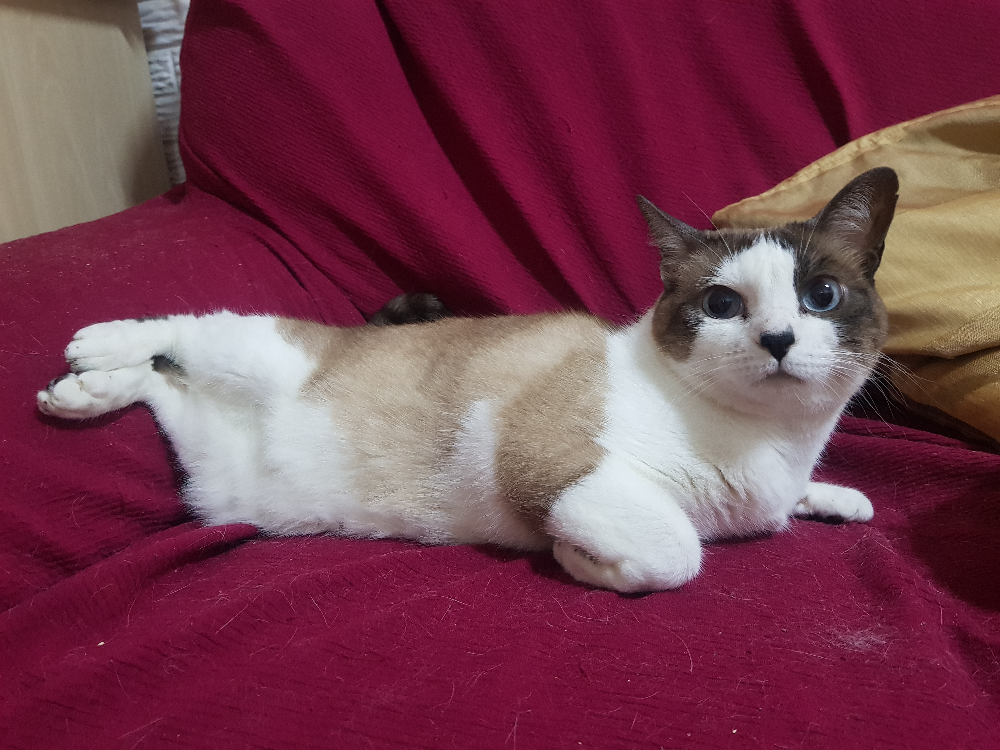

In [ ]:
img = open_image('/content/20200226_210320.jpg')
img

In [ ]:
classes = ['aisha', 'meg', 'xael']
data2 = ImageDataBunch.single_from_classes(path, classes, ds_tfms=get_transforms(), size=224).normalize(imagenet_stats)
learn = cnn_learner(data2, models.resnet34)
learn.load('cats_1')

In [ ]:
pred_class,pred_idx,outputs = learn.predict(img)
print(pred_class)

aisha
